# Zero-DCE++ with Channel Attention
## Low-Light Image Enhancement — Evaluation Notebook

**Novelty:** SE-Block (Channel Attention) after Conv3  
**Targets:** PSNR > 19 dB | SSIM > 0.65 | LPIPS < 0.30

In [1]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm import tqdm
from skimage.metrics import structural_similarity as ssim_metric
from skimage.metrics import peak_signal_noise_ratio as psnr_metric
import warnings
warnings.filterwarnings('ignore')

# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# print(f'Device: {device}')
# if torch.cuda.is_available():
#     print(f'GPU: {torch.cuda.get_device_name(0)}')

device = torch.device('xpu' if torch.xpu.is_available() else 'cpu')
print(f'Device: {device}')
if torch.xpu.is_available():
    print(f'GPU: {torch.xpu.get_device_name(0)}')

# Optional metrics
try:
    import lpips
    LPIPS_AVAILABLE = True
    lpips_model = lpips.LPIPS(net='alex', verbose=False).to(device)
    lpips_model.eval()
    print('LPIPS loaded')
except ImportError:
    LPIPS_AVAILABLE = False
    print('LPIPS not available — install with: pip install lpips')

try:
    import pyiqa
    # pyiqa exposes many IQA metrics via create_metric(metric_name, device=device)
    try:
        niqe_metric = pyiqa.create_metric('niqe', device=device)
        NIQE_AVAILABLE = True
        print('NIQE (pyiqa) loaded')
    except Exception as e:
        NIQE_AVAILABLE = False
        print("pyiqa installed but NIQE model not available via pyiqa.create_metric('niqe'). Try: pip install -U pyiqa or pip install git+https://github.com/chaofengc/IQA-PyTorch.git")
except ImportError:
    NIQE_AVAILABLE = False
    print('pyiqa not installed — install with: pip install pyiqa')


Device: xpu
GPU: Intel(R) Iris(R) Xe Graphics
LPIPS loaded
NIQE (pyiqa) loaded


### Model Definition (must be identical to training)

In [2]:
class SEBlock(nn.Module):
    def __init__(self, channels, reduction=8):
        super(SEBlock, self).__init__()
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channels, channels // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channels // reduction, channels, bias=False),
            nn.Sigmoid()
        )
    def forward(self, x):
        b, c, _, _ = x.shape
        w = self.pool(x).view(b, c)
        w = self.fc(w).view(b, c, 1, 1)
        return x * w

class DCENet(nn.Module):
    def __init__(self, use_attention=True):
        super(DCENet, self).__init__()
        self.use_attention = use_attention
        self.conv1 = nn.Conv2d(3,  32, 3, 1, 1)
        self.conv2 = nn.Conv2d(32, 32, 3, 1, 1)
        self.conv3 = nn.Conv2d(32, 32, 3, 1, 1)
        if use_attention:
            self.se = SEBlock(32, reduction=8)
        self.conv4 = nn.Conv2d(32, 32, 3, 1, 1)
        self.conv5 = nn.Conv2d(64, 32, 3, 1, 1)
        self.conv6 = nn.Conv2d(64, 32, 3, 1, 1)
        self.conv7 = nn.Conv2d(64, 24, 3, 1, 1)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x1 = self.relu(self.conv1(x))
        x2 = self.relu(self.conv2(x1))
        x3 = self.relu(self.conv3(x2))
        if self.use_attention:
            x3 = self.se(x3)
        x4 = self.relu(self.conv4(x3))
        x5 = self.relu(self.conv5(torch.cat([x4, x3], 1)))
        x6 = self.relu(self.conv6(torch.cat([x5, x2], 1)))
        x7 = torch.cat([x6, x1], 1)
        # FIX: tanh MUST be here — matches training notebook
        return torch.tanh(self.conv7(x7))

def enhance_image_with_curves(x, alpha):
    """Apply Zero-DCE curve: LE(x;a) = x + a*x*(1-x), 8 iterations"""
    enhanced = x.clone()
    for i in range(8):
        a_i = alpha[:, i*3:(i+1)*3, :, :]
        enhanced = enhanced + a_i * enhanced * (1 - enhanced)
    return torch.clamp(enhanced, 0, 1)

print('Model and curve function defined')


Model and curve function defined


### Dataset — Full Original Resolution (no forced resize)

In [3]:
class LOLDataset(Dataset):
    """
    Evaluation dataset: loads images at ORIGINAL resolution.
    No resizing or cropping — metrics must be on native pixels.
    """
    def __init__(self, image_pairs):
        self.image_pairs = image_pairs

    def __len__(self):
        return len(self.image_pairs)

    def __getitem__(self, idx):
        pair = self.image_pairs[idx]
        low_img    = Image.open(pair['low']).convert('RGB')
        normal_img = Image.open(pair['normal']).convert('RGB')
        low_tensor    = transforms.ToTensor()(low_img)
        normal_tensor = transforms.ToTensor()(normal_img)
        return {'low': low_tensor, 'normal': normal_tensor,
                'filename': pair['filename']}

def load_image_pairs(data_path):
    """
    FIX: LOL-v2 uses numeric filenames (1.png, 2.png...).
    .replace('low','normal') silently fails — pair by sorted order instead.
    """
    low_path    = data_path / 'Low'
    normal_path = data_path / 'Normal'
    low_images    = sorted([f for f in os.listdir(low_path)
                            if f.endswith(('.jpg', '.png'))])
    normal_images = sorted([f for f in os.listdir(normal_path)
                            if f.endswith(('.jpg', '.png'))])
    assert len(low_images) == len(normal_images), (
        f'Mismatch: {len(low_images)} low vs {len(normal_images)} normal'
    )
    pairs = []
    for low_f, normal_f in zip(low_images, normal_images):
        pairs.append({
            'low':      str(low_path    / low_f),
            'normal':   str(normal_path / normal_f),
            'filename': low_f
        })
    return pairs

print('Dataset helpers defined')


Dataset helpers defined


### Load Model and Test Data

In [4]:
CHECKPOINT = 'best_zerodce_seblock_v5_hybrid.pth'  # update filename as needed
BASE_PATH  = Path('LOL-v2')

model = DCENet(use_attention=True).to(device)
model.load_state_dict(torch.load(CHECKPOINT, map_location=device))
model.eval()
print(f'Model loaded from: {CHECKPOINT}')
print(f'Parameters: {sum(p.numel() for p in model.parameters()):,}')

test_pairs  = load_image_pairs(BASE_PATH / 'Real_captured' / 'Test')
# batch_size=1 for full-resolution images (variable sizes won't stack otherwise)
test_dataset = LOLDataset(test_pairs)
test_loader  = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0)
print(f'Test set: {len(test_pairs)} images')


Model loaded from: best_zerodce_seblock_v5_hybrid.pth
Parameters: 79,672
Test set: 100 images


### Evaluation Loop

In [5]:
test_metrics = {'psnr': [], 'ssim': [], 'lpips': [], 'niqe': []}
enhanced_images, low_images, normal_images, filenames = [], [], [], []

with torch.no_grad():
    pbar = tqdm(test_loader, desc='Evaluating')
    for batch in pbar:
        low_imgs    = batch['low'].to(device)
        normal_imgs = batch['normal'].to(device)

        alpha    = model(low_imgs)
        enhanced = enhance_image_with_curves(low_imgs, alpha)

        # ── Safety clamp: guarantee [0,1], no NaN or Inf ──────────
        enhanced = torch.clamp(enhanced, 0.0, 1.0)
        if torch.isnan(enhanced).any() or torch.isinf(enhanced).any():
            print(f"  WARNING: NaN/Inf in enhanced output for {batch['filename'][0]} — skipping")
            continue

        # ── numpy conversion (float32, no uint8) ──────────────────
        enh_np = enhanced.squeeze(0).cpu().permute(1, 2, 0).numpy()
        ref_np = normal_imgs.squeeze(0).cpu().permute(1, 2, 0).numpy()
        low_np = low_imgs.squeeze(0).cpu().permute(1, 2, 0).numpy()

        # ── PSNR / SSIM (always safe) ──────────────────────────────
        psnr_val = psnr_metric(ref_np, enh_np, data_range=1.0)
        ssim_val = ssim_metric(ref_np, enh_np, channel_axis=2, data_range=1.0)
        test_metrics['psnr'].append(psnr_val)
        test_metrics['ssim'].append(ssim_val)

        # ── LPIPS (guard against SVD failure on flat regions) ──────
        if LPIPS_AVAILABLE:
            try:
                # Add tiny noise to break degenerate flat regions
                enh_t = (enhanced * 2 - 1).clamp(-1, 1)
                ref_t = (normal_imgs * 2 - 1).clamp(-1, 1)
                enh_t = enh_t + torch.randn_like(enh_t) * 1e-6
                lp = lpips_model(enh_t, ref_t).item()
                test_metrics['lpips'].append(lp)
            except Exception as e:
                print(f"  LPIPS skipped for {batch['filename'][0]}: {type(e).__name__}")
                test_metrics['lpips'].append(float('nan'))

        # ── NIQE (guard against matrix errors too) ─────────────────
        if NIQE_AVAILABLE:
            try:
                niqe_score = niqe_metric(enhanced)
                niqe_val = niqe_score.item() if hasattr(niqe_score, 'item') else float(niqe_score)
                test_metrics['niqe'].append(niqe_val)
            except Exception as e:
                print(f"  NIQE skipped for {batch['filename'][0]}: {type(e).__name__}")
                test_metrics['niqe'].append(float('nan'))

        enhanced_images.append(enh_np)
        low_images.append(low_np)
        normal_images.append(ref_np)
        filenames.append(batch['filename'][0])

        pbar.set_postfix({'PSNR': f'{psnr_val:.2f}', 'SSIM': f'{ssim_val:.3f}'})

print('Evaluation complete!')

Evaluating:   1%|          | 1/100 [00:04<06:45,  4.09s/it, PSNR=17.89, SSIM=0.521]

  NIQE skipped for low00690.png: RuntimeError


Evaluating:   2%|▏         | 2/100 [00:04<02:58,  1.82s/it, PSNR=17.64, SSIM=0.484]

  NIQE skipped for low00691.png: RuntimeError


Evaluating:   3%|▎         | 3/100 [00:04<01:46,  1.10s/it, PSNR=19.38, SSIM=0.604]

  NIQE skipped for low00692.png: RuntimeError


Evaluating:   4%|▍         | 4/100 [00:04<01:14,  1.29it/s, PSNR=19.14, SSIM=0.621]

  NIQE skipped for low00693.png: RuntimeError


Evaluating:   5%|▌         | 5/100 [00:05<00:55,  1.71it/s, PSNR=20.09, SSIM=0.602]

  NIQE skipped for low00694.png: RuntimeError


Evaluating:   6%|▌         | 6/100 [00:05<00:44,  2.11it/s, PSNR=20.10, SSIM=0.600]

  NIQE skipped for low00695.png: RuntimeError


Evaluating:   7%|▋         | 7/100 [00:05<00:38,  2.43it/s, PSNR=17.00, SSIM=0.403]

  NIQE skipped for low00696.png: RuntimeError


Evaluating:   8%|▊         | 8/100 [00:05<00:32,  2.82it/s, PSNR=16.94, SSIM=0.396]

  NIQE skipped for low00697.png: RuntimeError


Evaluating:   9%|▉         | 9/100 [00:06<00:28,  3.19it/s, PSNR=17.63, SSIM=0.329]

  NIQE skipped for low00698.png: RuntimeError


Evaluating:  10%|█         | 10/100 [00:06<00:25,  3.48it/s, PSNR=17.52, SSIM=0.312]

  NIQE skipped for low00699.png: RuntimeError


Evaluating:  11%|█         | 11/100 [00:06<00:24,  3.65it/s, PSNR=11.20, SSIM=0.518]

  NIQE skipped for low00700.png: RuntimeError


Evaluating:  12%|█▏        | 12/100 [00:06<00:23,  3.80it/s, PSNR=11.23, SSIM=0.525]

  NIQE skipped for low00701.png: RuntimeError


Evaluating:  13%|█▎        | 13/100 [00:07<00:21,  3.98it/s, PSNR=15.47, SSIM=0.478]

  NIQE skipped for low00702.png: RuntimeError


Evaluating:  14%|█▍        | 14/100 [00:07<00:21,  4.08it/s, PSNR=15.44, SSIM=0.477]

  NIQE skipped for low00703.png: RuntimeError


Evaluating:  15%|█▌        | 15/100 [00:07<00:20,  4.11it/s, PSNR=15.33, SSIM=0.474]

  NIQE skipped for low00704.png: RuntimeError


Evaluating:  16%|█▌        | 16/100 [00:07<00:21,  3.87it/s, PSNR=14.91, SSIM=0.383]

  NIQE skipped for low00705.png: RuntimeError


Evaluating:  17%|█▋        | 17/100 [00:08<00:20,  3.96it/s, PSNR=15.02, SSIM=0.395]

  NIQE skipped for low00706.png: RuntimeError


Evaluating:  18%|█▊        | 18/100 [00:08<00:20,  4.07it/s, PSNR=14.88, SSIM=0.382]

  NIQE skipped for low00707.png: RuntimeError


Evaluating:  19%|█▉        | 19/100 [00:08<00:19,  4.17it/s, PSNR=19.03, SSIM=0.445]

  NIQE skipped for low00708.png: RuntimeError


Evaluating:  20%|██        | 20/100 [00:08<00:19,  4.19it/s, PSNR=18.43, SSIM=0.459]

  NIQE skipped for low00709.png: RuntimeError


Evaluating:  21%|██        | 21/100 [00:08<00:18,  4.26it/s, PSNR=15.06, SSIM=0.627]

  NIQE skipped for low00710.png: RuntimeError


Evaluating:  22%|██▏       | 22/100 [00:09<00:18,  4.31it/s, PSNR=15.10, SSIM=0.627]

  NIQE skipped for low00711.png: RuntimeError


Evaluating:  23%|██▎       | 23/100 [00:09<00:17,  4.37it/s, PSNR=13.95, SSIM=0.808]

  NIQE skipped for low00712.png: RuntimeError


Evaluating:  24%|██▍       | 24/100 [00:09<00:17,  4.38it/s, PSNR=13.85, SSIM=0.808]

  NIQE skipped for low00713.png: RuntimeError


Evaluating:  25%|██▌       | 25/100 [00:09<00:17,  4.26it/s, PSNR=14.94, SSIM=0.654]

  NIQE skipped for low00714.png: RuntimeError


Evaluating:  26%|██▌       | 26/100 [00:10<00:17,  4.30it/s, PSNR=15.19, SSIM=0.653]

  NIQE skipped for low00715.png: RuntimeError


Evaluating:  27%|██▋       | 27/100 [00:10<00:16,  4.35it/s, PSNR=11.48, SSIM=0.631]

  NIQE skipped for low00716.png: RuntimeError


Evaluating:  28%|██▊       | 28/100 [00:10<00:16,  4.40it/s, PSNR=18.44, SSIM=0.398]

  NIQE skipped for low00717.png: RuntimeError


Evaluating:  29%|██▉       | 29/100 [00:10<00:16,  4.32it/s, PSNR=9.63, SSIM=0.550] 

  NIQE skipped for low00718.png: RuntimeError


Evaluating:  30%|███       | 30/100 [00:11<00:16,  4.28it/s, PSNR=9.65, SSIM=0.552]

  NIQE skipped for low00719.png: RuntimeError


Evaluating:  31%|███       | 31/100 [00:11<00:15,  4.32it/s, PSNR=14.53, SSIM=0.552]

  NIQE skipped for low00720.png: RuntimeError


Evaluating:  32%|███▏      | 32/100 [00:11<00:16,  4.20it/s, PSNR=14.96, SSIM=0.550]

  NIQE skipped for low00721.png: RuntimeError


Evaluating:  33%|███▎      | 33/100 [00:11<00:16,  4.16it/s, PSNR=9.81, SSIM=0.554] 

  NIQE skipped for low00722.png: RuntimeError


Evaluating:  34%|███▍      | 34/100 [00:12<00:16,  4.07it/s, PSNR=9.60, SSIM=0.556]

  NIQE skipped for low00723.png: RuntimeError


Evaluating:  35%|███▌      | 35/100 [00:12<00:15,  4.12it/s, PSNR=11.47, SSIM=0.482]

  NIQE skipped for low00724.png: RuntimeError


Evaluating:  36%|███▌      | 36/100 [00:12<00:15,  4.17it/s, PSNR=11.22, SSIM=0.495]

  NIQE skipped for low00725.png: RuntimeError


Evaluating:  37%|███▋      | 37/100 [00:12<00:15,  4.14it/s, PSNR=8.81, SSIM=0.625] 

  NIQE skipped for low00726.png: RuntimeError


Evaluating:  38%|███▊      | 38/100 [00:12<00:14,  4.17it/s, PSNR=9.02, SSIM=0.612]

  NIQE skipped for low00727.png: RuntimeError


Evaluating:  39%|███▉      | 39/100 [00:13<00:14,  4.20it/s, PSNR=9.00, SSIM=0.562]

  NIQE skipped for low00728.png: RuntimeError


Evaluating:  40%|████      | 40/100 [00:13<00:14,  4.18it/s, PSNR=7.65, SSIM=0.613]

  NIQE skipped for low00729.png: RuntimeError


Evaluating:  41%|████      | 41/100 [00:13<00:14,  4.05it/s, PSNR=7.74, SSIM=0.610]

  NIQE skipped for low00730.png: RuntimeError


Evaluating:  42%|████▏     | 42/100 [00:13<00:13,  4.15it/s, PSNR=9.56, SSIM=0.658]

  NIQE skipped for low00731.png: RuntimeError


Evaluating:  43%|████▎     | 43/100 [00:14<00:13,  4.22it/s, PSNR=9.72, SSIM=0.652]

  NIQE skipped for low00732.png: RuntimeError


Evaluating:  44%|████▍     | 44/100 [00:14<00:13,  4.15it/s, PSNR=9.70, SSIM=0.635]

  NIQE skipped for low00733.png: RuntimeError


Evaluating:  45%|████▌     | 45/100 [00:14<00:13,  4.21it/s, PSNR=9.65, SSIM=0.636]

  NIQE skipped for low00734.png: RuntimeError


Evaluating:  46%|████▌     | 46/100 [00:14<00:12,  4.25it/s, PSNR=13.03, SSIM=0.580]

  NIQE skipped for low00735.png: RuntimeError


Evaluating:  47%|████▋     | 47/100 [00:15<00:12,  4.25it/s, PSNR=13.06, SSIM=0.588]

  NIQE skipped for low00736.png: RuntimeError


Evaluating:  48%|████▊     | 48/100 [00:15<00:12,  4.25it/s, PSNR=10.72, SSIM=0.635]

  NIQE skipped for low00737.png: RuntimeError


Evaluating:  49%|████▉     | 49/100 [00:15<00:11,  4.32it/s, PSNR=11.01, SSIM=0.626]

  NIQE skipped for low00738.png: RuntimeError


Evaluating:  50%|█████     | 50/100 [00:15<00:11,  4.29it/s, PSNR=20.02, SSIM=0.395]

  NIQE skipped for low00739.png: RuntimeError


Evaluating:  51%|█████     | 51/100 [00:16<00:11,  4.11it/s, PSNR=19.95, SSIM=0.391]

  NIQE skipped for low00740.png: RuntimeError


Evaluating:  52%|█████▏    | 52/100 [00:16<00:11,  4.15it/s, PSNR=11.64, SSIM=0.530]

  NIQE skipped for low00741.png: RuntimeError


Evaluating:  53%|█████▎    | 53/100 [00:16<00:11,  4.17it/s, PSNR=15.38, SSIM=0.263]

  NIQE skipped for low00742.png: RuntimeError


Evaluating:  54%|█████▍    | 54/100 [00:16<00:11,  4.17it/s, PSNR=11.45, SSIM=0.568]

  NIQE skipped for low00743.png: RuntimeError


Evaluating:  55%|█████▌    | 55/100 [00:17<00:10,  4.18it/s, PSNR=15.41, SSIM=0.503]

  NIQE skipped for low00744.png: RuntimeError


Evaluating:  56%|█████▌    | 56/100 [00:17<00:10,  4.25it/s, PSNR=13.40, SSIM=0.524]

  NIQE skipped for low00745.png: RuntimeError


Evaluating:  57%|█████▋    | 57/100 [00:17<00:09,  4.32it/s, PSNR=13.38, SSIM=0.511]

  NIQE skipped for low00746.png: RuntimeError


Evaluating:  58%|█████▊    | 58/100 [00:17<00:09,  4.31it/s, PSNR=14.97, SSIM=0.514]

  NIQE skipped for low00747.png: RuntimeError


Evaluating:  59%|█████▉    | 59/100 [00:17<00:09,  4.29it/s, PSNR=14.87, SSIM=0.524]

  NIQE skipped for low00748.png: RuntimeError


Evaluating:  60%|██████    | 60/100 [00:18<00:09,  4.29it/s, PSNR=16.81, SSIM=0.455]

  NIQE skipped for low00749.png: RuntimeError


Evaluating:  61%|██████    | 61/100 [00:18<00:09,  4.28it/s, PSNR=18.27, SSIM=0.417]

  NIQE skipped for low00750.png: RuntimeError


Evaluating:  62%|██████▏   | 62/100 [00:18<00:09,  4.12it/s, PSNR=18.23, SSIM=0.387]

  NIQE skipped for low00751.png: RuntimeError


Evaluating:  63%|██████▎   | 63/100 [00:18<00:09,  4.08it/s, PSNR=18.03, SSIM=0.412]

  NIQE skipped for low00752.png: RuntimeError


Evaluating:  64%|██████▍   | 64/100 [00:19<00:08,  4.09it/s, PSNR=13.61, SSIM=0.378]

  NIQE skipped for low00753.png: RuntimeError


Evaluating:  65%|██████▌   | 65/100 [00:19<00:08,  4.11it/s, PSNR=13.68, SSIM=0.378]

  NIQE skipped for low00754.png: RuntimeError


Evaluating:  66%|██████▌   | 66/100 [00:19<00:08,  4.16it/s, PSNR=17.93, SSIM=0.309]

  NIQE skipped for low00755.png: RuntimeError


Evaluating:  67%|██████▋   | 67/100 [00:19<00:07,  4.16it/s, PSNR=17.89, SSIM=0.298]

  NIQE skipped for low00756.png: RuntimeError


Evaluating:  68%|██████▊   | 68/100 [00:20<00:07,  4.03it/s, PSNR=18.54, SSIM=0.394]

  NIQE skipped for low00757.png: RuntimeError


Evaluating:  69%|██████▉   | 69/100 [00:20<00:07,  3.98it/s, PSNR=18.95, SSIM=0.400]

  NIQE skipped for low00758.png: RuntimeError


Evaluating:  70%|███████   | 70/100 [00:20<00:07,  4.08it/s, PSNR=11.62, SSIM=0.506]

  NIQE skipped for low00759.png: RuntimeError


Evaluating:  71%|███████   | 71/100 [00:20<00:06,  4.16it/s, PSNR=11.81, SSIM=0.533]

  NIQE skipped for low00760.png: RuntimeError


Evaluating:  72%|███████▏  | 72/100 [00:21<00:06,  4.17it/s, PSNR=15.23, SSIM=0.467]

  NIQE skipped for low00761.png: RuntimeError


Evaluating:  73%|███████▎  | 73/100 [00:21<00:06,  4.25it/s, PSNR=15.51, SSIM=0.466]

  NIQE skipped for low00762.png: RuntimeError


Evaluating:  74%|███████▍  | 74/100 [00:21<00:06,  4.28it/s, PSNR=11.15, SSIM=0.360]

  NIQE skipped for low00763.png: RuntimeError


Evaluating:  75%|███████▌  | 75/100 [00:21<00:05,  4.34it/s, PSNR=11.81, SSIM=0.350]

  NIQE skipped for low00764.png: RuntimeError


Evaluating:  76%|███████▌  | 76/100 [00:22<00:05,  4.28it/s, PSNR=16.10, SSIM=0.587]

  NIQE skipped for low00765.png: RuntimeError


Evaluating:  77%|███████▋  | 77/100 [00:22<00:05,  4.20it/s, PSNR=16.21, SSIM=0.599]

  NIQE skipped for low00766.png: RuntimeError


Evaluating:  78%|███████▊  | 78/100 [00:22<00:05,  4.15it/s, PSNR=17.92, SSIM=0.378]

  NIQE skipped for low00767.png: RuntimeError


Evaluating:  79%|███████▉  | 79/100 [00:22<00:05,  4.12it/s, PSNR=19.11, SSIM=0.387]

  NIQE skipped for low00768.png: RuntimeError


Evaluating:  80%|████████  | 80/100 [00:22<00:04,  4.12it/s, PSNR=14.50, SSIM=0.322]

  NIQE skipped for low00769.png: RuntimeError


Evaluating:  81%|████████  | 81/100 [00:23<00:04,  4.04it/s, PSNR=14.44, SSIM=0.321]

  NIQE skipped for low00770.png: RuntimeError


Evaluating:  82%|████████▏ | 82/100 [00:23<00:04,  4.16it/s, PSNR=10.85, SSIM=0.375]

  NIQE skipped for low00771.png: RuntimeError


Evaluating:  83%|████████▎ | 83/100 [00:23<00:04,  4.20it/s, PSNR=10.73, SSIM=0.438]

  NIQE skipped for low00772.png: RuntimeError


Evaluating:  84%|████████▍ | 84/100 [00:23<00:04,  3.96it/s, PSNR=17.99, SSIM=0.392]

  NIQE skipped for low00773.png: RuntimeError


Evaluating:  85%|████████▌ | 85/100 [00:24<00:03,  3.99it/s, PSNR=17.92, SSIM=0.378]

  NIQE skipped for low00774.png: RuntimeError


Evaluating:  86%|████████▌ | 86/100 [00:24<00:03,  4.10it/s, PSNR=14.93, SSIM=0.602]

  NIQE skipped for low00775.png: RuntimeError


Evaluating:  87%|████████▋ | 87/100 [00:24<00:03,  4.11it/s, PSNR=15.41, SSIM=0.602]

  NIQE skipped for low00776.png: RuntimeError


Evaluating:  88%|████████▊ | 88/100 [00:24<00:02,  4.18it/s, PSNR=19.19, SSIM=0.517]

  NIQE skipped for low00777.png: RuntimeError


Evaluating:  89%|████████▉ | 89/100 [00:25<00:02,  4.22it/s, PSNR=19.63, SSIM=0.531]

  NIQE skipped for low00778.png: RuntimeError


Evaluating:  90%|█████████ | 90/100 [00:25<00:02,  4.17it/s, PSNR=13.65, SSIM=0.394]

  NIQE skipped for low00779.png: RuntimeError


Evaluating:  91%|█████████ | 91/100 [00:25<00:02,  4.17it/s, PSNR=13.78, SSIM=0.395]

  NIQE skipped for low00780.png: RuntimeError


Evaluating:  92%|█████████▏| 92/100 [00:25<00:01,  4.15it/s, PSNR=16.33, SSIM=0.648]

  NIQE skipped for low00781.png: RuntimeError


Evaluating:  93%|█████████▎| 93/100 [00:26<00:01,  4.14it/s, PSNR=16.52, SSIM=0.670]

  NIQE skipped for low00782.png: RuntimeError


Evaluating:  94%|█████████▍| 94/100 [00:26<00:01,  4.19it/s, PSNR=16.50, SSIM=0.669]

  NIQE skipped for low00783.png: RuntimeError


Evaluating:  95%|█████████▌| 95/100 [00:26<00:01,  4.22it/s, PSNR=16.44, SSIM=0.549]

  NIQE skipped for low00784.png: RuntimeError


Evaluating:  96%|█████████▌| 96/100 [00:26<00:00,  4.20it/s, PSNR=16.40, SSIM=0.540]

  NIQE skipped for low00785.png: RuntimeError


Evaluating:  97%|█████████▋| 97/100 [00:27<00:00,  3.89it/s, PSNR=16.45, SSIM=0.552]

  NIQE skipped for low00786.png: RuntimeError


Evaluating:  98%|█████████▊| 98/100 [00:27<00:00,  3.98it/s, PSNR=16.30, SSIM=0.362]

  NIQE skipped for low00787.png: RuntimeError


Evaluating:  99%|█████████▉| 99/100 [00:27<00:00,  3.94it/s, PSNR=16.02, SSIM=0.355]

  NIQE skipped for low00788.png: RuntimeError


Evaluating: 100%|██████████| 100/100 [00:27<00:00,  3.59it/s, PSNR=16.04, SSIM=0.357]

  NIQE skipped for low00789.png: RuntimeError
Evaluation complete!


### Results Summary

In [6]:
import numpy as np

# ── Build metrics_info from whatever was collected ─────────────────────────
metrics_info = [
    ('PSNR (dB)', test_metrics['psnr'],  '> 19.00', 19.0, True),
    ('SSIM',      test_metrics['ssim'],  '> 0.65',  0.65, True),
]
if LPIPS_AVAILABLE and test_metrics['lpips']:
    metrics_info.append(('LPIPS', test_metrics['lpips'], '< 0.30', 0.30, False))
if NIQE_AVAILABLE and test_metrics['niqe']:
    metrics_info.append(('NIQE',  test_metrics['niqe'],  '< 3.80', 3.80, False))

# ── Print summary ──────────────────────────────────────────────────────────
print('\n' + '='*55)
print('FINAL EVALUATION RESULTS')
print('='*55)

for name, vals, target, thresh, higher_better in metrics_info:
    clean   = [v for v in vals if not np.isnan(v)]
    if not clean:
        print(f'\n{name}: all values were NaN — skipped')
        continue
    mean_v  = np.mean(clean)
    std_v   = np.std(clean)
    skipped = len(vals) - len(clean)
    passed  = mean_v > thresh if higher_better else mean_v < thresh
    status  = 'PASS' if passed else 'FAIL'
    print(f'\n{name}:')
    print(f'  Mean:    {mean_v:.4f}')
    print(f'  Std:     {std_v:.4f}')
    print(f'  Min:     {np.min(clean):.4f}')
    print(f'  Max:     {np.max(clean):.4f}')
    if skipped:
        print(f'  Skipped: {skipped} image(s) — NaN (SVD/metric error)')
    print(f'  Target:  {target}  →  [{status}]')

print('\n' + '='*55)


FINAL EVALUATION RESULTS

PSNR (dB):
  Mean:    14.7069
  Std:     3.2591
  Min:     7.6481
  Max:     20.0995
  Target:  > 19.00  →  [FAIL]

SSIM:
  Mean:    0.5009
  Std:     0.1147
  Min:     0.2631
  Max:     0.8085
  Target:  > 0.65  →  [FAIL]

LPIPS:
  Mean:    0.4057
  Std:     0.1174
  Min:     0.1980
  Max:     0.6645
  Target:  < 0.30  →  [FAIL]

NIQE: all values were NaN — skipped



### Metrics Distribution

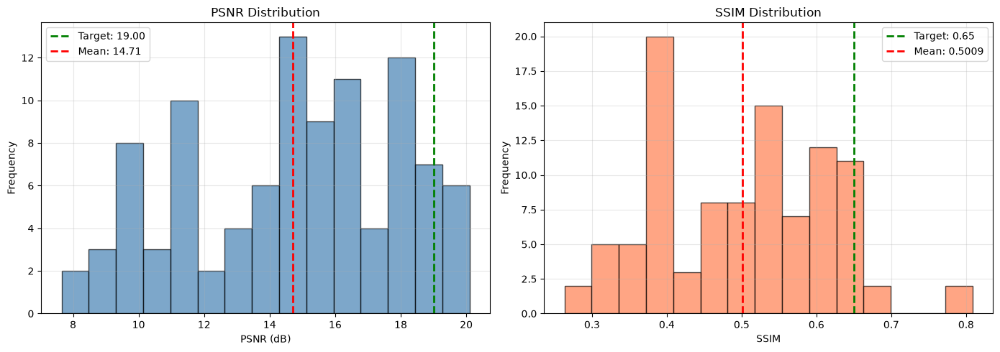

Saved: metrics_distribution.png


In [7]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(test_metrics['psnr'], bins=15, edgecolor='black', alpha=0.7, color='steelblue')
axes[0].axvline(19, color='green', linestyle='--', linewidth=2, label='Target: 19.00')
axes[0].axvline(np.mean(test_metrics['psnr']), color='red', linestyle='--', linewidth=2,
                label=f"Mean: {np.mean(test_metrics['psnr']):.2f}")
axes[0].set_xlabel('PSNR (dB)'); axes[0].set_ylabel('Frequency')
axes[0].set_title('PSNR Distribution'); axes[0].legend(); axes[0].grid(True, alpha=0.3)

axes[1].hist(test_metrics['ssim'], bins=15, edgecolor='black', alpha=0.7, color='coral')
axes[1].axvline(0.65, color='green', linestyle='--', linewidth=2, label='Target: 0.65')
axes[1].axvline(np.mean(test_metrics['ssim']), color='red', linestyle='--', linewidth=2,
                label=f"Mean: {np.mean(test_metrics['ssim']):.4f}")
axes[1].set_xlabel('SSIM'); axes[1].set_ylabel('Frequency')
axes[1].set_title('SSIM Distribution'); axes[1].legend(); axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('metrics_distribution.png', dpi=150)
plt.show()
print('Saved: metrics_distribution.png')


### Visual Comparison: Low-Light | Enhanced | Ground Truth

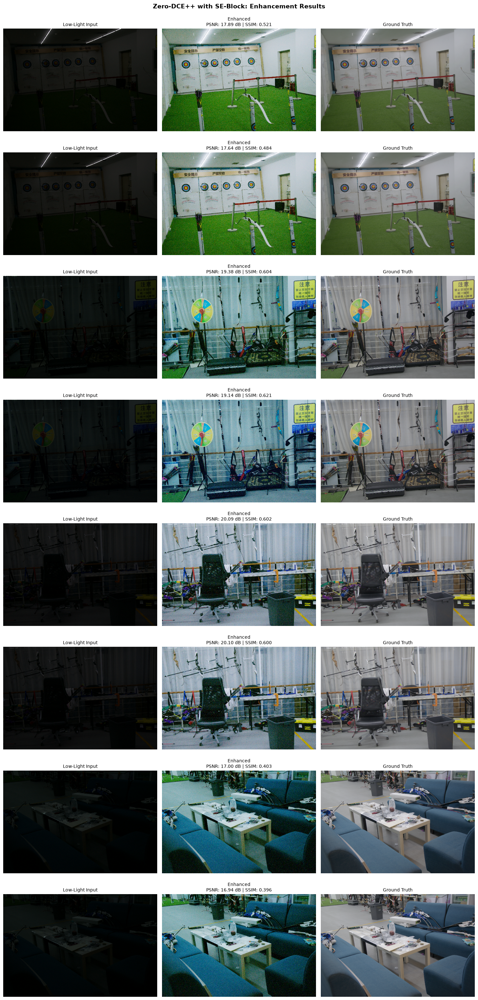

Saved: evaluation_results.png


In [8]:
num_show = min(8, len(enhanced_images))
fig, axes = plt.subplots(num_show, 3, figsize=(15, 4*num_show))

for idx in range(num_show):
    axes[idx, 0].imshow(np.clip(low_images[idx], 0, 1))
    axes[idx, 0].set_title('Low-Light Input', fontsize=10)
    axes[idx, 0].axis('off')

    axes[idx, 1].imshow(np.clip(enhanced_images[idx], 0, 1))
    p = test_metrics['psnr'][idx]
    s = test_metrics['ssim'][idx]
    axes[idx, 1].set_title(f'Enhanced\nPSNR: {p:.2f} dB | SSIM: {s:.3f}', fontsize=10)
    axes[idx, 1].axis('off')

    axes[idx, 2].imshow(np.clip(normal_images[idx], 0, 1))
    axes[idx, 2].set_title('Ground Truth', fontsize=10)
    axes[idx, 2].axis('off')

plt.suptitle('Zero-DCE++ with SE-Block: Enhancement Results\n\n', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('evaluation_results.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: evaluation_results.png')


### Per-Image Results Table

In [9]:
print(f"{'Filename':<25} {'PSNR':>8} {'SSIM':>8}" +
      (f" {'LPIPS':>8}" if LPIPS_AVAILABLE and test_metrics['lpips'] else '') + '\n' +
      '-'*55)
for i, fname in enumerate(filenames):
    lp_str = f"{test_metrics['lpips'][i]:>8.4f}" if LPIPS_AVAILABLE and test_metrics['lpips'] else ''
    print(f"{fname:<25} {test_metrics['psnr'][i]:>8.2f} {test_metrics['ssim'][i]:>8.4f}{lp_str}")
print('-'*55)
print(f"{'MEAN':<25} {np.mean(test_metrics['psnr']):>8.2f} {np.mean(test_metrics['ssim']):>8.4f}" +
      (f" {np.mean(test_metrics['lpips']):>8.4f}" if LPIPS_AVAILABLE and test_metrics['lpips'] else ''))


Filename                      PSNR     SSIM    LPIPS
-------------------------------------------------------
low00690.png                 17.89   0.5211  0.2824
low00691.png                 17.64   0.4841  0.2900
low00692.png                 19.38   0.6041  0.2616
low00693.png                 19.14   0.6212  0.2553
low00694.png                 20.09   0.6017  0.2752
low00695.png                 20.10   0.6000  0.2785
low00696.png                 17.00   0.4026  0.4302
low00697.png                 16.94   0.3956  0.4303
low00698.png                 17.63   0.3289  0.6112
low00699.png                 17.52   0.3124  0.6214
low00700.png                 11.20   0.5183  0.3737
low00701.png                 11.23   0.5253  0.3689
low00702.png                 15.47   0.4783  0.5212
low00703.png                 15.44   0.4771  0.5210
low00704.png                 15.33   0.4739  0.5203
low00705.png                 14.91   0.3831  0.6465
low00706.png                 15.02   0.3951  0.6645
low0070

### 9. Diagnosing the color cast — per-channel curve strength

Reuses images already computed in the evaluation loop above (no re-running the full test set).
Re-runs the model on ONE selected image to pull out its 24-channel `alpha` (8 curve
iterations \u00d7 R/G/B), sums each channel's contribution across the 8 iterations, and
compares that against the actual channel-mean shift versus ground truth. If one channel's
curve is consistently pushed harder than the others, that's the mechanical source of the cast
-- separate from (and not fixed by) the DPED color/content losses, which only look at overall
blurred color, not per-channel curve balance.


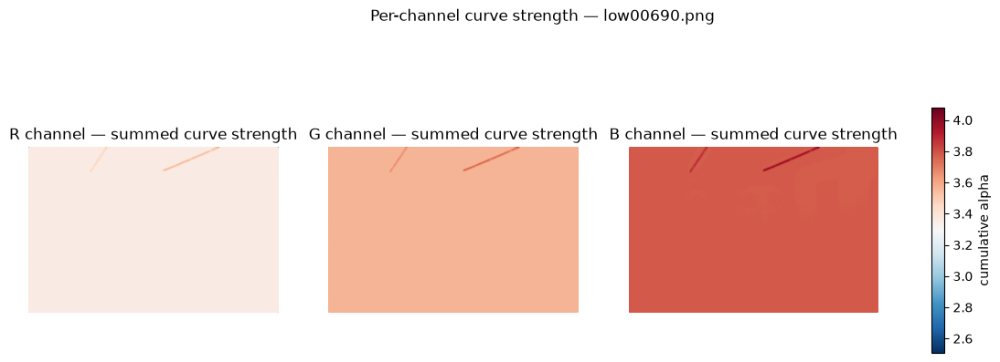

Channel      Low input    Enhanced  Ground truth
R               0.0541      0.4457        0.4261
G               0.0624      0.5630        0.4547
B               0.0437      0.4262        0.3919

Mean cumulative alpha per channel (higher = that channel's curve pushed harder):
  R: 3.3626
  G: 3.5621
  B: 3.7761


In [11]:
idx = 0  # change this to inspect a different test image (0..len(filenames)-1)

sample_low  = low_images[idx]
sample_enh  = enhanced_images[idx]
sample_ref  = normal_images[idx]
sample_name = filenames[idx]

low_tensor = torch.from_numpy(sample_low).permute(2, 0, 1).unsqueeze(0).float().to(device)
with torch.no_grad():
    alpha = model(low_tensor)  # [1, 24, H, W] -- 8 iterations x (R,G,B)

channel_names = ['R', 'G', 'B']
alpha_per_channel = []
for c in range(3):
    total = sum(alpha[0, i*3 + c] for i in range(8)).cpu().numpy()
    alpha_per_channel.append(total)

# ── Spatial heatmaps: where is each channel's curve pushing hardest? ──
vmax = max(a.max() for a in alpha_per_channel)
vmin = min(a.min() for a in alpha_per_channel)
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for c, name in enumerate(channel_names):
    im = axes[c].imshow(alpha_per_channel[c], cmap='RdBu_r', vmin=vmin, vmax=vmax)
    axes[c].set_title(f'{name} channel \u2014 summed curve strength')
    axes[c].axis('off')
fig.colorbar(im, ax=axes, shrink=0.7, label='cumulative alpha')
plt.suptitle(f'Per-channel curve strength \u2014 {sample_name}')
plt.savefig('alpha_channel_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Mean channel values: does the enhanced image drift further from GT than the input did? ──
print(f"{'Channel':<10}{'Low input':>12}{'Enhanced':>12}{'Ground truth':>14}")
for c, name in enumerate(channel_names):
    print(f"{name:<10}{sample_low[...,c].mean():>12.4f}{sample_enh[...,c].mean():>12.4f}{sample_ref[...,c].mean():>14.4f}")

print()
print('Mean cumulative alpha per channel (higher = that channel\'s curve pushed harder):')
for c, name in enumerate(channel_names):
    print(f'  {name}: {alpha_per_channel[c].mean():.4f}')